# Plant Disease Detection!

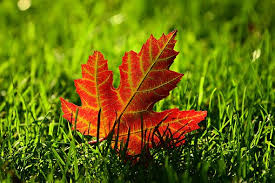

In [0]:
from IPython.display import Image
Image('image.jpg',height=500,width=1000)

# Data Description-

The dataset contains 54,305 images. The images span 14 crop species: 
Apple, Blueberry,Corn, Cherry, Grape, Orange, Peach, Bell Pepper, Potato, Raspberry, Soybean, Squash, Strawberry, and Tomato. 

It contains images of 17 fungal diseases, 4 bacterial diseases, 2 molds (oomycete) diseases, 2 viral diseases, and 1 disease caused by a mite. 

12 crop species also have images of healthy leaves that are not visibly affected by a disease.

It has 14 crop species and 26 diseases belonging to 38 classes.

The goal of this challenge is to develop algorithms than can accurately diagnose a disease based on an image.

Dataset link-(used only colored image)

https://github.com/spMohanty/PlantVillage-Dataset

# Metric

*  F1_score,Precision,Recall

*  Confusion matrix

*  Precision matrix-It tells What proportion of positive identifications was actually correct.

*  Recall matrix-It tells What proportion of actual positives was identified correctly.









# Loss

As it is multiclass classification problem,i have used multi log loss (cross entropy) to minimize.





*References:-*

1- https://arxiv.org/ftp/arxiv/papers/1604/1604.03169.pdf

2-https://blog.keras.io/building-powerful-image-classification-models-using-very-little-data.html

3-https://github.com/bkleyn/plant_diseases

# Loading data And understanding the data

In [0]:
#importing necessary libraries

"""

these are some important libraries which needed to be installed for easy working

"""

%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from mpl_toolkits.axes_grid1 import ImageGrid

import re
import os
import numpy as np
import pandas as pd
import seaborn as sns
from shutil import copyfile
from tqdm import tqdm

import keras
from keras.models import Sequential, load_model,Model
from keras.layers import Dense, Dropout, Activation,ReLU,Flatten, Conv2D, MaxPooling2D,BatchNormalization
from keras.optimizers import Adam
from keras.callbacks import Callback, EarlyStopping, ModelCheckpoint
from keras.preprocessing import image
from keras import regularizers

import tensorflow as tf
from keras.layers import GlobalAveragePooling2D
from keras.callbacks import ReduceLROnPlateau, CSVLogger
from keras.preprocessing.image import ImageDataGenerator

from PIL import Image
import numpy as np
from skimage import transform

Using TensorFlow backend.


In [ ]:
# Path variables
data_dir = "color/"

# Get list of all classes
classes = os.listdir(data_dir)
classes

In [0]:
# Path variables
"""
in data dir,we mention the path which contains the data folder
"""

data_dir = "color/"

# Get list of all classes

""" this will get all name of all the subfolders present in data dir"""

classes = os.listdir(data_dir)
classes

['Pepper,_bell___Bacterial_spot',
 'Corn_(maize)___Northern_Leaf_Blight',
 'Orange___Haunglongbing_(Citrus_greening)',
 'Cherry_(including_sour)___healthy',
 'Grape___Black_rot',
 'Tomato___Early_blight',
 'Grape___healthy',
 'Grape___Esca_(Black_Measles)',
 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot',
 'Apple___Black_rot',
 'Apple___Apple_scab',
 'Peach___healthy',
 'Tomato___healthy',
 'Soybean___healthy',
 'Apple___healthy',
 'Apple___Cedar_apple_rust',
 'Corn_(maize)___healthy',
 'Tomato___Leaf_Mold',
 'Peach___Bacterial_spot',
 'Potato___healthy',
 'Corn_(maize)___Common_rust_',
 'Blueberry___healthy',
 'Tomato___Target_Spot',
 'Tomato___Septoria_leaf_spot',
 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)',
 'Strawberry___healthy',
 'Raspberry___healthy',
 'Strawberry___Leaf_scorch',
 'Pepper,_bell___healthy',
 'Potato___Late_blight',
 'Squash___Powdery_mildew',
 'Cherry_(including_sour)___Powdery_mildew',
 'Tomato___Spider_mites Two-spotted_spider_mite',
 'Tomato___Tomato_Y

In [0]:
# Number of images in each class

"""in this code snippet,we count the number of images in each class and represent this as a dataframe.

working of the code- using a for loop we count the # of images in each subfolder (contained in main folder) 
and append it to a dictionary and from that dict we make a dataframe."""

image_counts = {}
for c in classes:
    try:
        path = data_dir + c
        count = len(os.listdir(path))
        image_counts[c] = count
    except:
        pass

df=pd.DataFrame.from_dict(image_counts, orient='index')
df

,0
"Pepper,_bell___Bacterial_spot",997
Corn_(maize)___Northern_Leaf_Blight,985
Orange___Haunglongbing_(Citrus_greening),5507
Cherry_(including_sour)___healthy,854
Grape___Black_rot,1180
Tomato___Early_blight,1000
Grape___healthy,423
Grape___Esca_(Black_Measles),1383
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot,513
Apple___Black_rot,621


In [0]:
#total number of images
print("Total number of images:", sum(image_counts.values()))

Total number of images: 54305


In [0]:
# Get path and label for each image

"""enumerate function allows us to loop over something and have an automatic counter. 

we make a dataframe here which contains the file,label and its class name.

working of the code- we go to each subfolder available in the main folder and since the name of each subfolder
is the class_name, we append the files in each subfolder while naming it in the format of class_name/file_name
to a list df along with label(with help of enumerate) and class name

"""

df=[]
for label, class_name in enumerate(classes):
    path = data_dir + class_name
    for file in os.listdir(path):
        df.append(['{}/{}'.format(class_name, file), label, class_name])
            
df = pd.DataFrame(df, columns=['file', 'label', 'class_name'])

In [0]:
#showing few datapoints
df.head()

,file,label,class_name
0,"Pepper,_bell___Bacterial_spot/113d374f-8b12-45...",0,"Pepper,_bell___Bacterial_spot"
1,"Pepper,_bell___Bacterial_spot/197fdd19-46d1-46...",0,"Pepper,_bell___Bacterial_spot"
2,"Pepper,_bell___Bacterial_spot/162f0add-8d7d-47...",0,"Pepper,_bell___Bacterial_spot"
3,"Pepper,_bell___Bacterial_spot/b8b69a41-e188-4c...",0,"Pepper,_bell___Bacterial_spot"
4,"Pepper,_bell___Bacterial_spot/70985466-254f-47...",0,"Pepper,_bell___Bacterial_spot"


In [0]:
#function used in plotting
import re

"""read_img function is used to take a image and convert it to array 
and format_name is used to replace _ with space
"""

def read_img(filepath, size):
    
    """Read and resize image.
    # Arguments
        filepath: path of image
        size: resize the original image.
    # Returns
        Image as numpy array.
    """
    
    img = image.load_img(data_dir + filepath, target_size=size)
    img = image.img_to_array(img)
    return img

def format_name(s):
    return re.sub('_+', ' ', s)

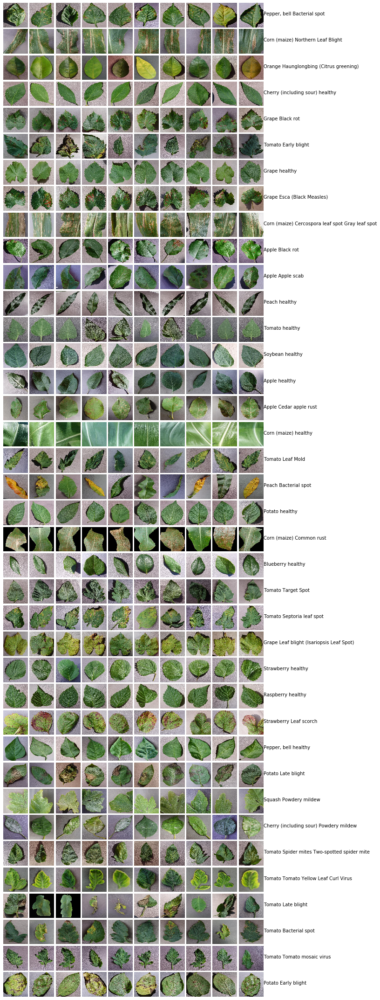

In [0]:
from matplotlib import pyplot as plt

""" this code is plotting 10 images from each class"""


# Plot some images
num_classes = len(classes)
fig = plt.figure(1, figsize=(10, 40))
grid = ImageGrid(fig, 111, nrows_ncols=(num_classes, 10), axes_pad=0.05)

i = 0
for label, class_name in enumerate(classes):
    for filepath in df['file'][df['class_name'] == class_name].values[:10]:
        ax = grid[i]
        img = read_img(filepath, (256, 256))
        ax.imshow(img / 255.)
        ax.axis('off')
        if i % 10 == 10 - 1:
            name = format_name(filepath.split('/')[0])
            ax.text(260, 112, name , verticalalignment='center')
        i += 1
        
plt.show()
#plt.savefig("fig1.png")

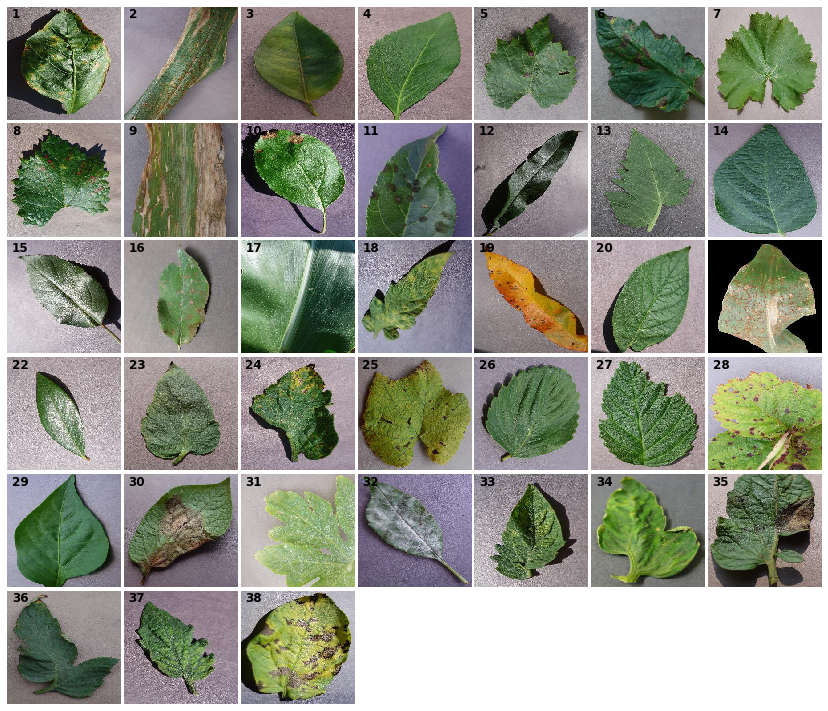

In [0]:
# Plot image from each class

"""showing and labelling one image from each class"""

fig = plt.figure(1, figsize=(15, 10))
grid = ImageGrid(fig, 111, nrows_ncols=(6, 7), axes_pad=0.05)

for i in range(42):
    ax = grid[i]
    ax.axis('off')
    if i < len(classes):
        class_name = classes[i]
        for filepath in df[df['class_name'] == class_name]['file'].values[:1]:
            img = read_img(filepath, (256, 256))
            ax.imshow(img / 255.)
            ax.annotate(i+1, xy=(10,25), color="black", fontsize=12, fontweight='bold')
plt.tight_layout()
#plt.savefig("fig2.png")

# Train -Test split

Process of splitting into train & test-


*   make two folder within the data folder and name them train and test.


*   In the train and test folder make c subfolder where c is number of classes present in the data folder with the name same as   class.


*   Now make a dataframe which contains the path of the image(eg Apple__Apple_scab/00075aa8..) as file_name,label and class name.


*   Using the numpy bionomial number generator,generate 54305(equal to num of images) number with n=1(#trails), p=0.8(train_size).


*   Start a loop over filename in df,If the number generated is 1,then append that image(filename) to train else it will go to the test.
















In [0]:
# Set input directory

"""
in data dir,we mention the path which contains the data folder
"""

data_dir = "color/"

# Get classes

"""this will get name of all the subfolders present in main folder"""

classes = os.listdir(data_dir)
num_classes = len(classes)
print("Number of classes:",num_classes)


# Create train test directories

"""with help of mkdir ,we will create two folder named as train and test in main folder"""

os.mkdir(data_dir+'train')
os.mkdir(data_dir+'test')


# Create new class directories for train and test images

"""within train and test folder,make c subfolder where c is number of subfolder present in the main
   folder with the same name as subfolder's name. """

for c in classes:
    os.mkdir(data_dir+'train/' + c)
    os.mkdir(data_dir+'test/' + c)

    
# Get path and label for each image

"""
we make a dataframe here which contains the file,label and its class name.
we go to each subfolder available in the main folder and since the name of each subfolder
is the class name, we append the files in each subfolder while naming it in the format of class_name/file_name
to df along with label(with help of enumerate) and class name.
"""

df = []
for label, class_name in enumerate(classes):
    path = data_dir + class_name
    
    for file in os.listdir(path):
        df.append(['{}/{}'.format(class_name, file), label, class_name])
            
            
df = pd.DataFrame(df, columns=['file', 'label', 'class_name'])

#gives total no. of classes which is same as total no. of subfolder with the main folder.
num_images = len(df)

print("Number of images:", num_images)   

Number of classes: 38
Number of images: 54305


In [0]:
#showing some datapoints
df.head()

,file,label,class_name
0,"Pepper,_bell___Bacterial_spot/113d374f-8b12-45...",0,"Pepper,_bell___Bacterial_spot"
1,"Pepper,_bell___Bacterial_spot/197fdd19-46d1-46...",0,"Pepper,_bell___Bacterial_spot"
2,"Pepper,_bell___Bacterial_spot/162f0add-8d7d-47...",0,"Pepper,_bell___Bacterial_spot"
3,"Pepper,_bell___Bacterial_spot/b8b69a41-e188-4c...",0,"Pepper,_bell___Bacterial_spot"
4,"Pepper,_bell___Bacterial_spot/70985466-254f-47...",0,"Pepper,_bell___Bacterial_spot"


In [0]:
# Sample train/test observations

"""
Using the numpy bionomial number generator,generate 54305(equal to num of images)
number with n=1(#trails), p=0.8(train_size).
Start a loop over filename in df,If the number generated is 1,then append that image(filename) 
to train else it will go to the test.
"""

tr_size=0.8
np.random.seed(50)
num = np.random.binomial(1,tr_size, num_images)

# Import images
i = 0
for file in tqdm(df['file'].values):

    from_path = data_dir + file
    if num[i] == 1:
        to_path = data_dir+'train/' + file       
    else:
        to_path = data_dir+'test/' + file

    copyfile(from_path, to_path)
    i += 1

100%|██████████| 54305/54305 [00:05<00:00, 9354.79it/s] 


In [0]:
#mentioning the train and test dir
TRAIN_DIR = "color/train/"
TEST_DIR = "color/test/"

In [0]:
# Get path and label for each image in test and train dir and calculating no. of samples in train and test

"""we make a dataframe here which contains the file,label,class name & train_ind.
we go to each subfolder available in the train & test folder and since the name of each subfolder
is the class name, we append the files in each subfolder while naming it in the format of class_name/file_name
to df along with label(with help of enumerate),class name and train_ind.
if the train_ind=1,then it is showing that the file is in train folder while 0 shows the file lies withing test folder
"""

df=[]
for label, class_name in enumerate(classes):
    
    # Train
    path = TRAIN_DIR + class_name
    for file in os.listdir(path):
        df.append(['{}/{}'.format(class_name, file), label, class_name, 1])

    # test
    path = TEST_DIR + class_name
    for file in os.listdir(path):
        df.append(['{}/{}'.format(class_name, file), label, class_name, 0])

df = pd.DataFrame(df, columns=['file', 'label', 'class_name', 'train_ind'])

num_train_samples = df.train_ind.sum()
num_test_samples = len(df) - num_train_samples

print("Number of train images:", num_train_samples)
print("Number of test images:", num_test_samples)

Number of train images: 43616
Number of test images: 10689


In [0]:
#showing some datapoints
df.head()

,file,label,class_name,train_ind
0,"Pepper,_bell___Bacterial_spot/113d374f-8b12-45...",0,"Pepper,_bell___Bacterial_spot",1
1,"Pepper,_bell___Bacterial_spot/197fdd19-46d1-46...",0,"Pepper,_bell___Bacterial_spot",1
2,"Pepper,_bell___Bacterial_spot/162f0add-8d7d-47...",0,"Pepper,_bell___Bacterial_spot",1
3,"Pepper,_bell___Bacterial_spot/b8b69a41-e188-4c...",0,"Pepper,_bell___Bacterial_spot",1
4,"Pepper,_bell___Bacterial_spot/70985466-254f-47...",0,"Pepper,_bell___Bacterial_spot",1


# AlexNet Model from scratch

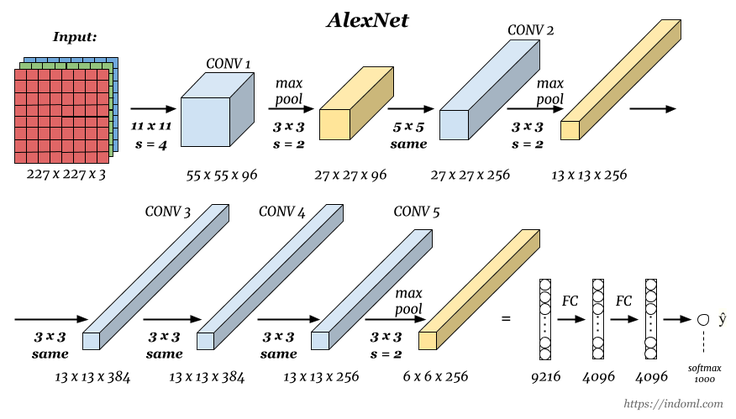

In [0]:
from IPython.display import Image
Image('alexnet.png',height=500,width=800)

Image Augmentations techniques are methods of artificially increasing the variations of images in our data-set by using horizontal/vertical flips, rotations, variations in brightness of images, horizontal/vertical shifts etc and this image augmentation is performed by ImageDataGenerator.

In [0]:
# Specify data generator inputs
train_datagen = ImageDataGenerator(rescale=1./255,
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True)

test_datagen = ImageDataGenerator(rescale=1./255)

here we are using keras flow from directory to get the train and test data.

Remember to set shuffle=False in test_generator otherwise there will randomness while predicting.

In [0]:
width,height,depth= 256, 256 ,3
batch =100

train_generator = train_datagen.flow_from_directory(
    TRAIN_DIR,
    target_size=(height,width),
    batch_size=batch) 


test_generator = test_datagen.flow_from_directory(
    TEST_DIR,
    target_size=(height,width),
    batch_size=batch,
    shuffle=False)

Found 43616 images belonging to 38 classes.
Found 10689 images belonging to 38 classes.


Alexnet architecture--

It contains 5 convolutional layers and 3 fully connected layers.

Relu is applied after every convolutional and fully connected layer.

Dropout is applied before the first and the second fully connected year. The image size in the  architecture is 256*256 

In [0]:
#define the architecture of the model

model = Sequential()

# 1st Convolutional Layer
model.add(Conv2D(filters=96, input_shape=(256,256,3), kernel_size=(11,11), strides=(4,4), padding='valid'))
model.add(Activation('relu'))
    #normalization
model.add(BatchNormalization())
    # Max Pooling
model.add(MaxPooling2D(pool_size=(2,2), strides=(2,2), padding='valid'))

# 2nd Convolutional Layer
model.add(Conv2D(filters=256, kernel_size=(11,11), strides=(1,1), padding='valid'))
model.add(Activation('relu'))
    #normalization
model.add(BatchNormalization())
   # Max Pooling
model.add(MaxPooling2D(pool_size=(2,2), strides=(2,2), padding='valid'))

# 3rd Convolutional Layer
model.add(Conv2D(filters=384, kernel_size=(3,3), strides=(1,1), padding='valid'))
model.add(Activation('relu'))

# 4th Convolutional Layer
model.add(Conv2D(filters=384, kernel_size=(3,3), strides=(1,1), padding='valid'))
model.add(Activation('relu'))

# 5th Convolutional Layer
model.add(Conv2D(filters=256, kernel_size=(3,3), strides=(1,1), padding='valid'))
model.add(Activation('relu'))
   # Max Pooling
model.add(MaxPooling2D(pool_size=(2,2), strides=(2,2), padding='valid'))

# Passing it to a Fully Connected layer
model.add(Flatten())
# 1st Fully Connected Layer
model.add(Dense(512, input_shape=(256*256*3,)))
model.add(Activation('relu'))
# Add Dropout to prevent overfitting
model.add(Dropout(0.5))

# 2nd Fully Connected Layer
model.add(Dense(128))
model.add(Activation('relu'))
# Add Dropout
model.add(Dropout(0.5))
model.add(BatchNormalization())

# 3rd Fully Connected Layer
model.add(Dense(64))
model.add(Activation('relu'))


# Output Layer
model.add(Dense(38))
model.add(Activation('softmax'))

In [0]:
#it will show the layers used and no. of parameters after each layer
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 62, 62, 96)        34944     
_________________________________________________________________
activation_1 (Activation)    (None, 62, 62, 96)        0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 62, 62, 96)        384       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 31, 31, 96)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 21, 21, 256)       2973952   
_________________________________________________________________
activation_2 (Activation)    (None, 21, 21, 256)       0         
_________________________________________________________________
batch_normalization_2 (Batch (None, 21, 21, 256)      

********************************************************************************************************************
********************************************************************************************************************

As F1_score,precision and recall are not readily available in Keras to be used as metric so we introduce it via keras callback.

we create class Metrics and  define attributes train_data,val_data and batch size using __ init __ method and to get the attributes of parent class (callback) we will use super() keyword.

now we define on_train_begin method in which we will have f1,precision and recall for train and val data whose entry 
will be written by later method.

and then we have on_epoch_end method in which we will calculate weighted f1 score,precision and recall (using sklearn function) for train and val data after end of each epoch and print it.

*********************************************************************************************************************
*********************************************************************************************************************

In [0]:
#custom metric

#https://github.com/keras-team/keras/issues/10472

import itertools 

class Metrics(Callback):
        def __init__(self,tr_data, val_data, batch_size):
            super().__init__()
            self.train_data=tr_data
            self.validation_data = val_data
            self.batch_size = batch_size

        def on_train_begin(self, logs={}):
            self.tr_f1s=[]
            self.tr_recalls=[]
            self.tr_precisions=[]
            
            self.val_f1s = []
            self.val_recalls = []
            self.val_precisions = []

        def on_epoch_end(self, epoch, logs={}):
          
            batch_tr=len(self.train_data)
            total_tr=batch_tr*self.batch_size
            
            tr_pred= []
            tr_true= []
            
            for batch in range(batch_tr):
                xtr,ytr=next(self.train_data)
                
                tr_pred_batch=np.zeros((len(xtr)))
                tr_true_batch=np.zeros((len(ytr)))
                
                tr_pred_batch=np.argmax(np.asarray(self.model.predict(xtr)),axis=-1)
                tr_true_batch=np.argmax(ytr,axis=-1)
                
                tr_pred.append(tr_pred_batch)
                tr_true.append(tr_true_batch)
                                       
            tr_pred = np.asarray(list(itertools.chain.from_iterable(tr_pred)))
            tr_true = np.asarray(list(itertools.chain.from_iterable(tr_true)))                       

            _tr_f1 = f1_score(tr_true, tr_pred,average="weighted")
            _tr_precision = precision_score(tr_true, tr_pred,average="weighted")
            _tr_recall = recall_score(tr_true, tr_pred,average="weighted")

            self.tr_f1s.append(_tr_f1)
            self.tr_recalls.append(_tr_recall)
            self.tr_precisions.append(_tr_precision)
            
            logs['tr_f1s']= _tr_f1
            logs["tr_recall"]= _tr_recall
            logs["tr_precision"]= _tr_precision
            
            print("— tr_f1: {} — tr_recall: {} — tr_precision {}".format(_tr_f1, _tr_recall, _tr_precision))
            
           
            #for valid data
            batches = len(self.validation_data)
            total = batches * self.batch_size
            
            val_pred = []
            val_true = []
            
            for batch in range(batches):
                
                xVal, yVal = next(self.validation_data)
                
                val_pred_batch = np.zeros((len(xVal)))
                val_true_batch = np.zeros((len(xVal)))
               
                val_pred_batch = np.argmax(np.asarray(self.model.predict(xVal)), axis=-1) 
                val_true_batch = np.argmax(yVal,axis=-1)

                
                val_pred.append(val_pred_batch)
                val_true.append(val_true_batch)


            val_pred = np.asarray(list(itertools.chain.from_iterable(val_pred)))
            val_true = np.asarray(list(itertools.chain.from_iterable(val_true)))
           

            _val_f1 = f1_score(val_true, val_pred,average="weighted")
            _val_precision = precision_score(val_true, val_pred,average="weighted")
            _val_recall = recall_score(val_true, val_pred,average="weighted")

            self.val_f1s.append(_val_f1)
            self.val_recalls.append(_val_recall)
            self.val_precisions.append(_val_precision)
            
            logs['val_f1s']= _val_f1
            logs["val_recall"]= _val_recall
            logs["val_precision"]= _val_precision
            
            print("— val_f1: {} — val_recall: {} — val_precision {}".format(
                 _val_f1, _val_recall, _val_precision))

            return
          
metric=Metrics(train_generator,test_generator,batch_size=100)     

In [0]:
# Compile model

"""Compile defines the loss function, the optimizer and the metrics."""

model.compile(optimizer="adam",loss='categorical_crossentropy')

In [0]:
# Load the TensorBoard notebook extension

import tensorflow as tf
from keras.callbacks import TensorBoard
import datetime

"""Tensorboard is the interface used to visualize the graph and 
 other tools to understand, debug, and optimize the model. """

#https://www.tensorflow.org/tensorboard/r1/summaries
log_dir="log/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensor = TensorBoard(log_dir=log_dir)

'''The ModelCheckpoint callback class allows to define where to checkpoint the model weights,
   how the file should named and under what circumstances to make a checkpoint of the model'''

path="alex"+'.hdf5'
checkpoint = ModelCheckpoint(path,
                             monitor='val_loss',
                             mode='min',
                             verbose=1,
                             save_best_only=True)

'''ReduceLROnPlateau callback monitors a quantity and if no improvement is seen for 
   a 'patience' number of epochs, the learning rate is reduced. '''

reduce_lr = ReduceLROnPlateau(monitor='val_loss',
                             factor=0.2,
                              patience=5,
                              cooldown=5)

'''CSVLogger Callback store epoch results to a csv file.'''

filepath = "alex" + ".csv"
csv_log = CSVLogger(filepath)

In [0]:
# Fit transfer learning model
history = model.fit_generator(train_generator,
    epochs=12,
    steps_per_epoch=num_train_samples//batch,
    validation_data=test_generator,
    validation_steps=num_test_samples//batch,
    callbacks=[metric,checkpoint,reduce_lr,csv_log,tensor])

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where




Epoch 1/12
436/436 [==============================] - 733s 2s/step - loss: 3.0144 - val_loss: 4.2128
— tr_f1: 0.05614632785853618 — tr_recall: 0.1316030814380044 — tr_precision 0.1202936570094709
— val_f1: 0.06228297416598425 — val_recall: 0.13443727196182992 — val_precision 0.1541262684950112

Epoch 00001: val_loss improved from inf to 4.21279, saving model to alex.hdf5

Epoch 2/12
436/436 [==============================] - 719s 2s/step - loss: 2.3010 - val_loss: 2.5720
— tr_f1: 0.2296768797492647 — tr_recall: 0.2838866471019809 — tr_precision 0.315948789538517
— val_f1: 0.27988843936466706 — val_recall: 0.3335204415754514 — val_precision 0.3259304073251775

Epoch 00002: val_loss improved from 4.21279 to 2.57199, saving model to alex.hdf5
Epoch 3/12
436/436 [==============================] - 704s 2s/step - loss: 1.7846 - val_loss: 2.3006
— tr_f1: 0.39687806507408785 — tr_recall: 0.4382795

In [0]:
# tensorboard output
%load_ext tensorboard
%tensorboard --logdir log/fit

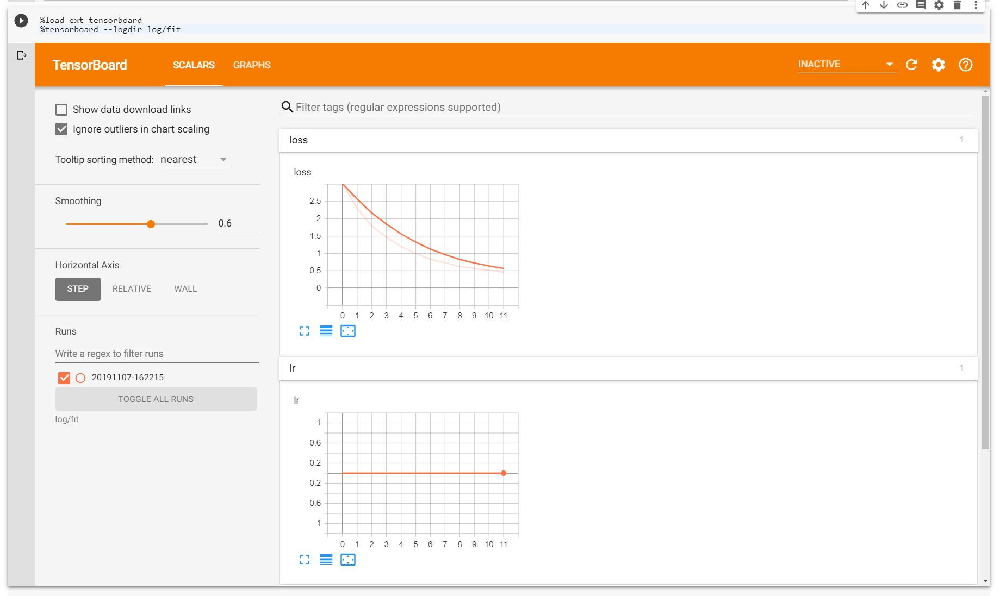

In [0]:
#tensorbord output screenshot
from IPython.display import Image
Image('1.png',height=600,width=800)

<Figure size 432x288 with 0 Axes>

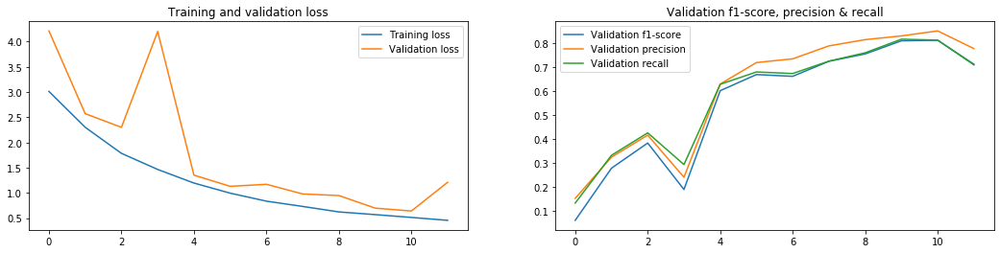

In [0]:
#plotting tr and test loss and various metrices on train and test data

"""creating a dataframe from history.history & storing val_f1,val_precision and val_recall from metric in dataframe
and then plotting the various metrics and loss."""

h_df = pd.DataFrame(history.history)

h_df['val_f1'] = metric.val_f1s
h_df['val_precision'] = metric.val_precisions
h_df['val_recall'] = metric.val_recalls

epochs = range(len(h_df['val_f1']))
plt.figure()
fig, ax = plt.subplots(1,2,figsize=(18,4))

ax[0].plot(epochs,h_df['loss'], label='Training loss')
ax[0].plot(epochs,h_df['val_loss'], label='Validation loss')
ax[0].set_title('Training and validation loss')
ax[0].legend()


ax[1].plot(epochs,h_df['val_f1'],label='Validation f1-score')
ax[1].plot(epochs,h_df['val_precision'],label='Validation precision')
ax[1].plot(epochs,h_df['val_recall'],label='Validation recall')
ax[1].set_title('Validation f1-score, precision & recall')
ax[1].legend()

plt.show()

In [0]:
#showing the saved csv(csvlogger)
alex_csv=pd.read_csv("alex.csv")
alex_csv

,epoch,loss,lr,tr_f1s,tr_precision,tr_recall,val_f1s,val_loss,val_precision,val_recall
0,0,3.013008,0.001,0.056146,0.120294,0.131603,0.062283,4.212793,0.154126,0.134437
1,1,2.301743,0.001,0.229677,0.315949,0.283887,0.279888,2.571985,0.325930,0.333520
2,2,1.784991,0.001,0.396878,0.426499,0.438280,0.384957,2.300637,0.417762,0.427355
3,3,1.465780,0.001,0.163913,0.229173,0.274509,0.191054,4.201081,0.242105,0.294976
4,4,1.196070,0.001,0.527862,0.614069,0.550555,0.603309,1.352928,0.631083,0.629993
5,5,0.995535,0.001,0.603403,0.693581,0.608378,0.670619,1.130777,0.720727,0.681448
6,6,0.836863,0.001,0.590309,0.697206,0.606727,0.663208,1.171070,0.736232,0.674899
7,7,0.732321,0.001,0.613231,0.740648,0.617961,0.726084,0.979582,0.790316,0.726635
8,8,0.623344,0.001,0.678035,0.766463,0.675990,0.756698,0.948146,0.816318,0.761437
9,9,0.570095,0.001,0.789108,0.817024,0.792347,0.811550,0.698848,0.831870,0.818131


In [0]:
# Loading the best saved model
model_alex = load_model("alex.hdf5")

In [0]:
# compute predictions

'''we need to reset the test_generator before whenever  calling the predict_generator. This is important, 
if we forget to reset the test_generator ,we will get outputs in a weird order.
and then predicting using the saved model.
predict_generator will give the prob for each class so we will choose the max prob using np.argmax and this will
give the pred_class.
also we will get the true class using test_gen.classes'''

test_generator.reset()

predictions = model_alex.predict_generator(generator=test_generator)
y_pred = [np.argmax(probas) for probas in predictions]
y_test = test_generator.classes

In [0]:
#sanity check
from sklearn import metrics as m
print("Precision_weighted:",m.precision_score(y_test, y_pred , average="weighted")*100)
print("Recall_weighted:",m.recall_score(y_test, y_pred , average="weighted")*100)
print("F1_weighted:",m.f1_score(y_test, y_pred , average="weighted")*100)

Precision_weighted: 85.28130199779145
Recall_weighted: 81.44821779399382
F1_weighted: 81.37781135181999


In [0]:
#getting the predicted class for test data

'''
y_pred has the predicted labels, 
but we can’t simply tell what the predictions are, because all we can see is numbers like 0,1,4,1,0,6…
and most importantly we need to map the predicted labels with their unique ids such 
as filenames to find out what we predicted for which image.'''

labels_map = (train_generator.class_indices)
labels = dict((v,k) for k,v in labels_map.items())
predict = [labels[k] for k in y_pred]

#storing the results in dataframe.
filenames=test_generator.filenames
results=pd.DataFrame({"Filename":filenames,
                      "Predictions":predict})

In [0]:
#dict of class & its labels
labels_map

{'Apple___Apple_scab': 0,
 'Apple___Black_rot': 1,
 'Apple___Cedar_apple_rust': 2,
 'Apple___healthy': 3,
 'Blueberry___healthy': 4,
 'Cherry_(including_sour)___Powdery_mildew': 5,
 'Cherry_(including_sour)___healthy': 6,
 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot': 7,
 'Corn_(maize)___Common_rust_': 8,
 'Corn_(maize)___Northern_Leaf_Blight': 9,
 'Corn_(maize)___healthy': 10,
 'Grape___Black_rot': 11,
 'Grape___Esca_(Black_Measles)': 12,
 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)': 13,
 'Grape___healthy': 14,
 'Orange___Haunglongbing_(Citrus_greening)': 15,
 'Peach___Bacterial_spot': 16,
 'Peach___healthy': 17,
 'Pepper,_bell___Bacterial_spot': 18,
 'Pepper,_bell___healthy': 19,
 'Potato___Early_blight': 20,
 'Potato___Late_blight': 21,
 'Potato___healthy': 22,
 'Raspberry___healthy': 23,
 'Soybean___healthy': 24,
 'Squash___Powdery_mildew': 25,
 'Strawberry___Leaf_scorch': 26,
 'Strawberry___healthy': 27,
 'Tomato___Bacterial_spot': 28,
 'Tomato___Early_blight': 29,
 'Toma

In [0]:
#showing some data from results
results.head()

,Filename,Predictions
0,Apple___Apple_scab/01f3deaa-6143-4b6c-9c22-620...,Corn_(maize)___healthy
1,Apple___Apple_scab/029424b0-0ef5-491b-9ef5-069...,Apple___Apple_scab
2,Apple___Apple_scab/058d5e64-2c57-45ba-94cb-ac8...,Cherry_(including_sour)___Powdery_mildew
3,Apple___Apple_scab/0631708e-5bac-4611-8ff9-6d5...,Apple___Apple_scab
4,Apple___Apple_scab/0672ab32-9fce-41f3-ae69-e39...,Apple___Apple_scab


this model is Not very good at predicting the class

In [0]:
#confusion matrix

from sklearn.metrics import confusion_matrix
def plot_confusion_matrix(test_y,predict_y):
    C = confusion_matrix(test_y, predict_y)
    
    print("Number of misclassified images-",(len(test_y)-np.trace(C)))
    print("% of misclassified images-",(len(test_y)-np.trace(C))*100/len(test_y))
    
    labels = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37]
    cmap=sns.light_palette("green")
    
    print("-"*50, "Confusion matrix", "-"*50)
    plt.figure(figsize=(20,10))
    sns.heatmap(C,annot=True, cmap=cmap,fmt=".1f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.show()

Number of misclassified images- 1983
% of misclassified images- 18.551782206006173
-------------------------------------------------- Confusion matrix --------------------------------------------------


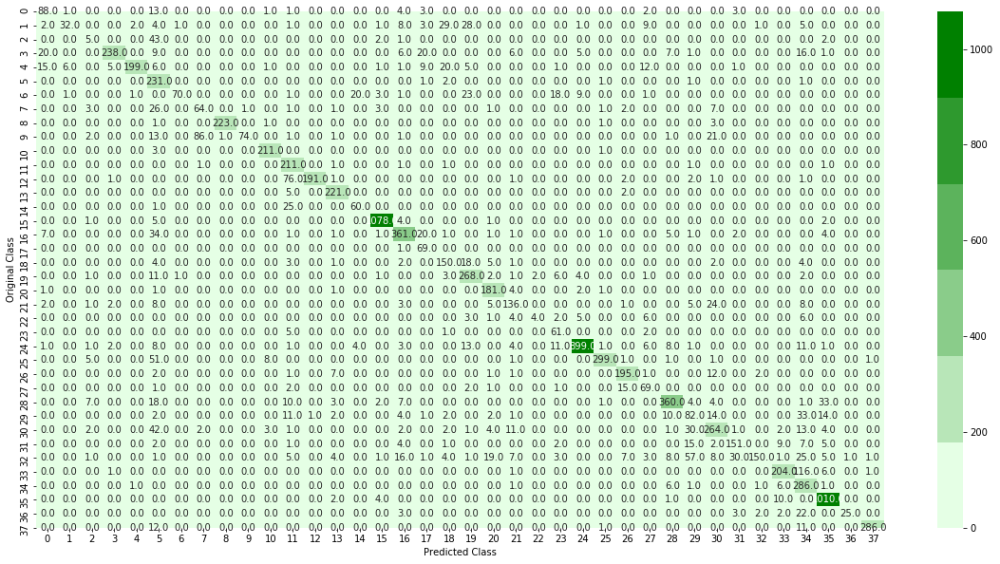

In [0]:
plot_confusion_matrix(y_test,y_pred) 

Number of misclasiification is high for this model.

In [0]:
def plot_recall_matrix(test_y,predict_y):
    C = confusion_matrix(test_y, predict_y)
    A =(((C.T)/(C.sum(axis=1))).T)
    
    """
    divide each element of the confusion matrix with the sum of elements in that column
    
    C = [[1, 2],
         [3, 4]]
    C.T = [[1, 3],
           [2, 4]]
    C.sum(axis = 1)  axis=0 corresonds to columns and axis=1 corresponds to rows in two diamensional array
    C.sum(axix =1) = [[3, 7]]
    ((C.T)/(C.sum(axis=1))) = [[1/3, 3/7]
                               [2/3, 4/7]]

    ((C.T)/(C.sum(axis=1))).T = [[1/3, 2/3]
                                [3/7, 4/7]]
    sum of row elements = 1"""
  
    labels = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37]
    cmap=sns.light_palette("blue")
    # representing A in heatmap format
    print("-"*50, "Recall matrix"    , "-"*50)
    plt.figure(figsize=(20,10))
    sns.heatmap(A, annot=True, cmap=cmap, fmt=".2f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.show()
    print("Sum of rows in recall matrix",A.sum(axis=1))

-------------------------------------------------- Recall matrix --------------------------------------------------


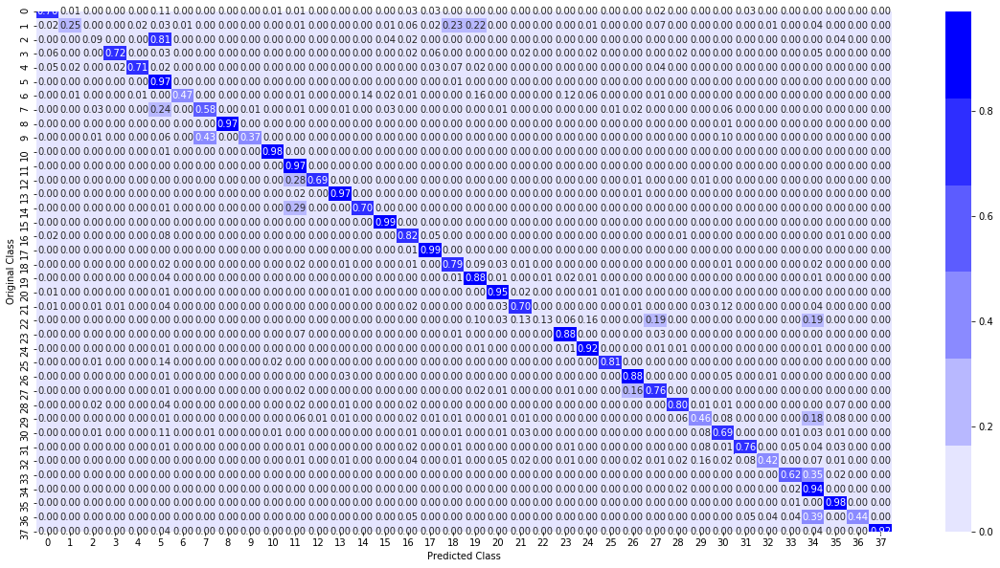

Sum of rows in recall matrix [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [0]:
plot_recall_matrix(y_test,y_pred)

In [0]:
def plot_precision_matrix(test_y,predict_y):
    C = confusion_matrix(test_y, predict_y)
    B =(C/C.sum(axis=0))
    
    '''
    divide each element of the confusion matrix with the sum of elements in that row
    C = [[1, 2],
         [3, 4]]
     C.sum(axis = 0)  axis=0 corresonds to columns and axis=1 corresponds to rows in two diamensional array
     C.sum(axix =0) = [[4, 6]]
     (C/C.sum(axis=0)) = [[1/4, 2/6],
                          [3/4, 4/6]] 
    '''

    labels = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37]
    cmap=sns.light_palette("red")
    print("-"*50, "Precision matrix", "-"*50)
    plt.figure(figsize=(20,10))
    sns.heatmap(B, annot=True, cmap=cmap, fmt=".2f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.show()
    print("Sum of columns in precision matrix",B.sum(axis=0))


-------------------------------------------------- Precision matrix --------------------------------------------------


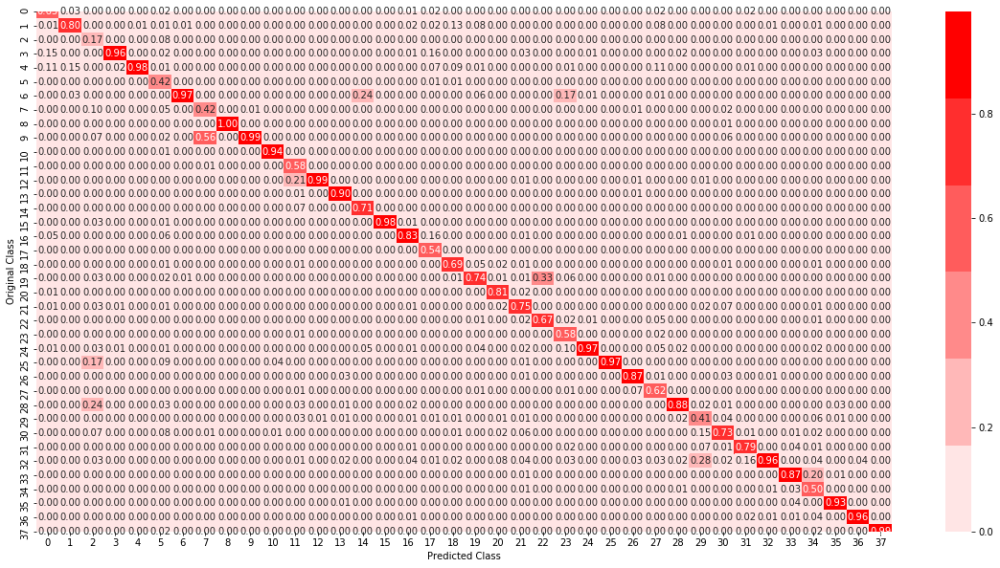

Sum of columns in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [0]:
plot_precision_matrix(y_test,y_pred)

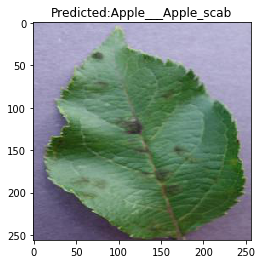

In [0]:
#final function for alexnet model
#predicting for a single image

'''pred_img function will take the image and then with help of alex_model predict the class and labels will 
help to map the class name and then plot the image with the title showing the predicted class'''

def pred_img(file):
    np_image = Image.open(file)
    np_image = np.array(np_image).astype('float32')/255
    np_image = transform.resize(np_image, (256, 256, 3))
    image = np.expand_dims(np_image, axis=0)
    pred=model_alex.predict_classes(image)
    clas=labels[pred[0]]
    plt.imshow(plt.imread(file))
    plt.title("Predicted:"+str(clas))
    plt.show()
    
#correct prediction
pred_img("apple_scab.jpg")  

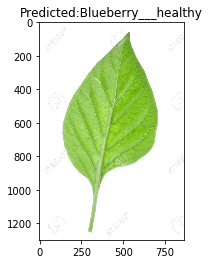

In [0]:
#predicting for a single image
#incorrect prediction
pred_img("pepper.jpg") 

# Inception V3 model

(Inception Layer) is a combination of all those layers (namely, 1×1 Convolutional layer, 3×3 Convolutional layer, 5×5 Convolutional layer) with their output filter banks concatenated into a single output vector forming the input of the next stage.

There is 1×1 Convolutional layer before applying another layer, which is mainly used for dimensionality reduction

A parallel Max Pooling layer, which provides another option to the inception layer.

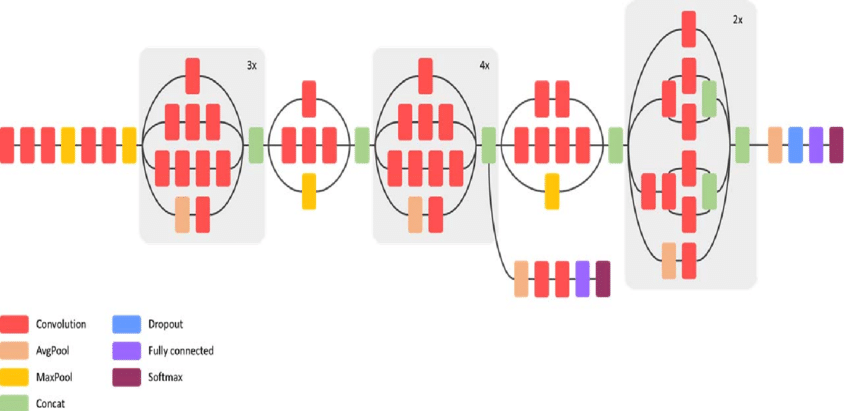

In [0]:
from IPython.display import Image
Image('inception.png')

In [0]:
# this part will prevent tensorflow to allocate all the avaliable GPU Memory
# backend
import tensorflow as tf
from keras import backend as k

# Don't pre-allocate memory; allocate as-needed
config = tf.ConfigProto()
config.gpu_options.allow_growth = True

# Create a session with the above options specified.
k.tensorflow_backend.set_session(tf.Session(config=config))

Image Augmentations techniques are methods of artificially increasing the variations of images in our data-set by using horizontal/vertical flips, rotations, variations in brightness of images, horizontal/vertical shifts etc and this image augmentation is performed by ImageDataGenerator.

In [0]:
from keras.applications.inception_v3 import InceptionV3, preprocess_input

# Specify data generator inputs
train_datagen = ImageDataGenerator(preprocessing_function=preprocess_input,
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True)

test_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)

here we are using keras flow from directory to get the train and test data.

Remember to set shuffle=False in test_generator otherwise there will randomness while predicting.


In [0]:
width,height,depth= 299, 299 ,3
batch =64

# Create data generators
train_generator = train_datagen.flow_from_directory(
    TRAIN_DIR,
    target_size=(width,height),
    batch_size=batch)

test_generator = test_datagen.flow_from_directory(
    TEST_DIR,
    target_size=(width,height),
    batch_size=batch,
    shuffle=False
    )

Found 43616 images belonging to 38 classes.
Found 10689 images belonging to 38 classes.


Transfer learning is a machine learning method where a model developed for a task is reused as the starting point for a model on a second task.

Here we are using inception v3 model which is trained on imagenet dataset and modifying the last few layers according to our needs.

In [0]:
#Get Inception model without final layer
base_model = InceptionV3(weights='imagenet', include_top=False)

# Add new fully connected layer to base model
x = base_model.output

x = GlobalAveragePooling2D()(x)

x = Dense(1024, activation='relu')(x)

x = Dropout(rate=0.5)(x)

output = Dense(38, activation='softmax')(x)
model = Model(input=base_model.input, output=output)

In [0]:
# Compile model

"""Compile defines the loss function, the optimizer and the metrics."""

model.compile(optimizer=Adam(lr=0.001),loss='categorical_crossentropy')

In [0]:
#it will show the layers used and no. of parameters after each layer
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, None, None, 3 0                                            
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, None, None, 3 864         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization_1 (BatchNor (None, None, None, 3 96          conv2d_1[0][0]                   
__________________________________________________________________________________________________
activation_1 (Activation)       (None, None, None, 3 0           batch_normalization_1[0][0]      
____________________________________________________________________________________________

As F1_score,precision and recall are not readily available in Keras to be used as metric so we introduce it via keras callback.

we create class Metrics and define attributes train_data,val_data and batch size using init method and to get the attributes of parent class (callback) we will use super() keyword.

now we define on_train_begin method in which we will have f1,precision and recall for train and val data whose entry will be written by later method.

and then we have on_epoch_end method in which we will calculate weighted f1 score,precision and recall (using sklearn function) for train and val data after end of each epoch and print it.


In [0]:
#https://github.com/keras-team/keras/issues/10472

import itertools 
class Metrics(Callback):
  
        def __init__(self,tr_data, val_data, batch_size):
            super().__init__()
            self.train_data=tr_data
            self.validation_data = val_data
            self.batch_size = batch_size

        def on_train_begin(self, logs={}):
            self.tr_f1s=[]
            self.tr_recalls=[]
            self.tr_precisions=[]
            
            self.val_f1s = []
            self.val_recalls = []
            self.val_precisions = []

        def on_epoch_end(self, epoch, logs={}):
          
            batch_tr=len(self.train_data)
            total_tr=batch_tr*self.batch_size
            
            tr_pred= []
            tr_true= []
            
            for batch in range(batch_tr):
                xtr,ytr=next(self.train_data)
                
                tr_pred_batch=np.zeros((len(xtr)))
                tr_true_batch=np.zeros((len(ytr)))
                
                tr_pred_batch=np.argmax(np.asarray(self.model.predict(xtr)),axis=-1)
                tr_true_batch=np.argmax(ytr,axis=-1)
                
                tr_pred.append(tr_pred_batch)
                tr_true.append(tr_true_batch)
                                       
            tr_pred = np.asarray(list(itertools.chain.from_iterable(tr_pred)))
            tr_true = np.asarray(list(itertools.chain.from_iterable(tr_true)))                       

            _tr_f1 = f1_score(tr_true, tr_pred,average="weighted")
            _tr_precision = precision_score(tr_true, tr_pred,average="weighted")
            _tr_recall = recall_score(tr_true, tr_pred,average="weighted")

            self.tr_f1s.append(_tr_f1)
            self.tr_recalls.append(_tr_recall)
            self.tr_precisions.append(_tr_precision)
            
            logs['tr_f1s']= _tr_f1
            logs["tr_recall"]= _tr_recall
            logs["tr_precision"]= _tr_precision
            
            print("— tr_f1: {} — tr_recall: {} — tr_precision {}".format(_tr_f1, _tr_recall, _tr_precision))
            
            batches = len(self.validation_data)
            total = batches * self.batch_size
            
            val_pred = []
            val_true = []
            
            for batch in range(batches):
                
                xVal, yVal = next(self.validation_data)
                
                val_pred_batch = np.zeros((len(xVal)))
                val_true_batch = np.zeros((len(xVal)))
               
                val_pred_batch = np.argmax(np.asarray(self.model.predict(xVal)), axis=-1) 
                val_true_batch = np.argmax(yVal,axis=-1)

                
                val_pred.append(val_pred_batch)
                val_true.append(val_true_batch)


            val_pred = np.asarray(list(itertools.chain.from_iterable(val_pred)))
            val_true = np.asarray(list(itertools.chain.from_iterable(val_true)))
           

            _val_f1 = f1_score(val_true, val_pred,average="weighted")
            _val_precision = precision_score(val_true, val_pred,average="weighted")
            _val_recall = recall_score(val_true, val_pred,average="weighted")

            self.val_f1s.append(_val_f1)
            self.val_recalls.append(_val_recall)
            self.val_precisions.append(_val_precision)
            
            logs['val_f1s']= _val_f1
            logs["val_recall"]= _val_recall
            logs["val_precision"]= _val_precision
            
            print("— val_f1: {} — val_recall: {} — val_precision {}".format(
                 _val_f1, _val_recall, _val_precision))

            return
          
metric=Metrics(train_generator,test_generator,batch_size=64)     

In [0]:
# Load the TensorBoard notebook extension
from keras.callbacks import TensorBoard
import datetime


"""Tensorboard is the interface used to visualize the graph and 
 other tools to understand, debug, and optimize the model. """

#https://www.tensorflow.org/tensorboard/r1/summaries

log_dir="logs1/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensor = TensorBoard(log_dir=log_dir)

'''The ModelCheckpoint callback class allows to define where to checkpoint the model weights,
   how the file should named and under what circumstances to make a checkpoint of the model'''

path="inception"+'.hdf5'

checkpoint = ModelCheckpoint(path,
                             monitor='val_loss',
                             mode='min',
                             verbose=1,
                             save_best_only=True)

'''ReduceLROnPlateau callback monitors a quantity and if no improvement is seen for 
   a 'patience' number of epochs, the learning rate is reduced. '''

reduce_lr = ReduceLROnPlateau(monitor='val_loss',
                              factor=0.2,
                              patience=4,
                              cooldown=5)

'''CSVLogger Callback store epoch results to a csv file.'''

filepath = "inception" + ".csv"

csv_log = CSVLogger(filepath)

In [0]:
# Fit transfer learning model
history = model.fit_generator(train_generator,epochs=15,
    steps_per_epoch=500,
    validation_data=test_generator,
    validation_steps=180,
    callbacks=[metric,checkpoint,reduce_lr,csv_log,tensor])

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where




Epoch 1/15
500/500 [==============================] - 681s 1s/step - loss: 0.5855 - val_loss: 0.8404
— tr_f1: 0.7761149969451141 — tr_recall: 0.781502201027146 — tr_precision 0.8441304239260359
— val_f1: 0.797748037062383 — val_recall: 0.8055009823182712 — val_precision 0.8547548684078947

Epoch 00001: val_loss improved from inf to 0.84041, saving model to inception.hdf5

Epoch 2/15
500/500 [==============================] - 643s 1s/step - loss: 0.2306 - val_loss: 0.6656
— tr_f1: 0.8211018767038183 — tr_recall: 0.8324238811445341 — tr_precision 0.8691871740350082
— val_f1: 0.8360716813297451 — val_recall: 0.8491907568528394 — val_precision 0.8819815090640326

Epoch 00002: val_loss improved from 0.84041 to 0.66565, saving model to inception.hdf5
Epoch 3/15
500/500 [==============================] - 648s 1s/step - loss: 0.1558 - val_loss: 0.6771
— tr_f1: 0.8714617131342741 — tr_recall: 0.870

In [0]:
#tensorboard output
%reload_ext tensorboard
%tensorboard --logdir logs1/fit

Reusing TensorBoard on port 6006 (pid 457), started 0:00:59 ago. (Use '!kill 457' to kill it.)

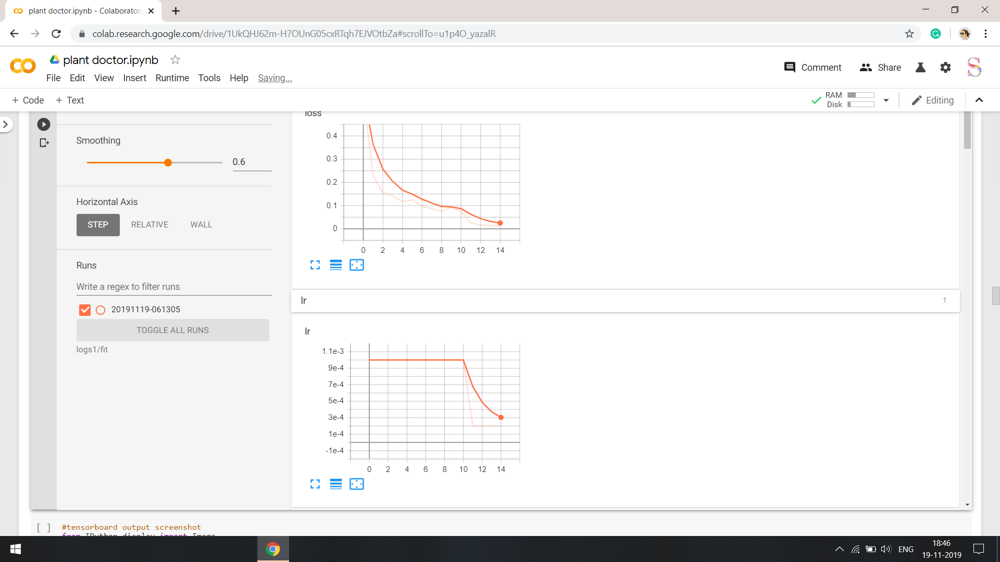

In [1]:
#tensorboard output screenshot
from IPython.display import Image
Image('1.png',height=600,width=800)

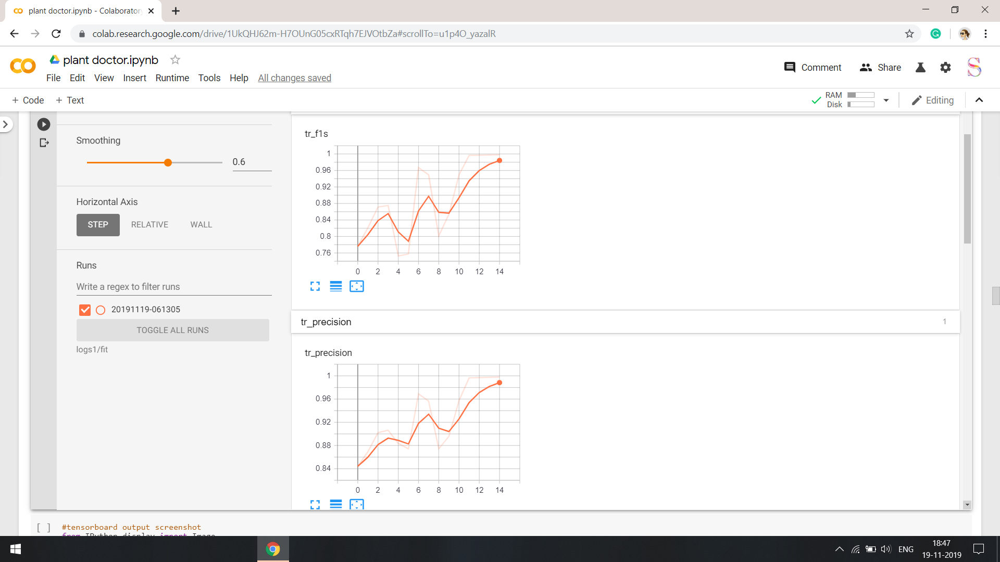

In [2]:
#tensorboard output screenshot
from IPython.display import Image
Image('2.png',height=600,width=800)

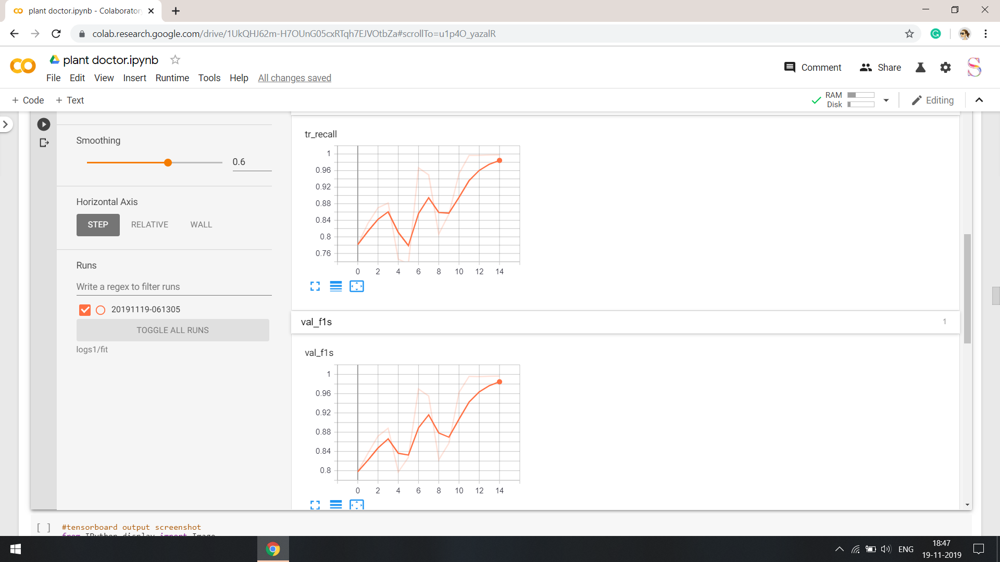

In [3]:
#tensorboard output screenshot
from IPython.display import Image
Image('3.png',height=600,width=800)

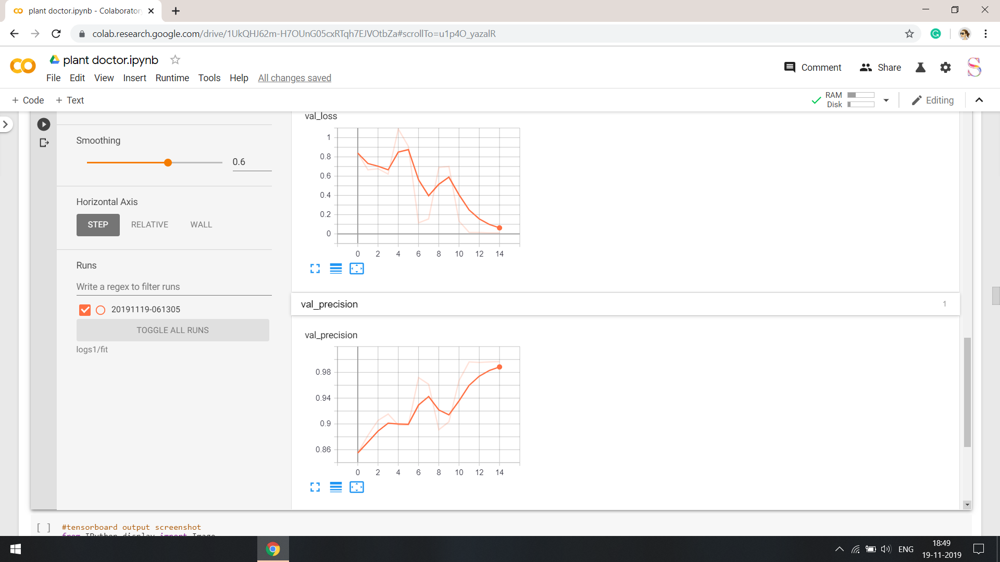

In [4]:
#tensorboard output screenshot
from IPython.display import Image
Image('4.png',height=600,width=800)

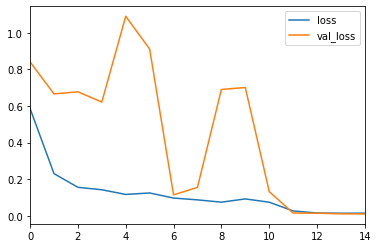

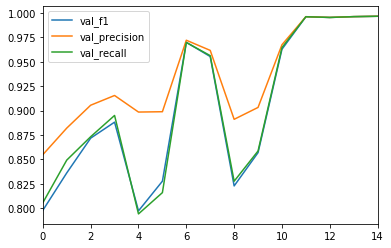

In [0]:
#plotting train and test loss and various metrices on train and test data

"""creating a dataframe from history.history & storing val_f1,val_precision and val_recall from metric in dataframe
and then plotting the various metrics and loss."""

history_df = pd.DataFrame(history.history)
history_df['val_f1'] = metric.val_f1s
history_df['val_precision'] = metric.val_precisions
history_df['val_recall'] = metric.val_recalls
history_df[['loss', 'val_loss']].plot()
history_df[['val_f1', 'val_precision', 'val_recall']].plot()

In [0]:
##showing the saved csv(csvlogger)
inc_csv=pd.read_csv("inception.csv")
inc_csv

,epoch,loss,lr,tr_f1s,tr_precision,tr_recall,val_f1s,val_loss,val_precision,val_recall
0,0,0.585630,0.0010,0.776115,0.844130,0.781502,0.797748,0.840412,0.854755,0.805501
1,1,0.230530,0.0010,0.821102,0.869187,0.832424,0.836072,0.665645,0.881982,0.849191
2,2,0.155807,0.0010,0.871462,0.902102,0.870208,0.871684,0.677144,0.905417,0.873141
3,3,0.142413,0.0010,0.875172,0.906221,0.881695,0.888073,0.621408,0.915393,0.894939
4,4,0.116933,0.0010,0.752963,0.883717,0.746240,0.797205,1.089696,0.898425,0.794087
5,5,0.124896,0.0010,0.757339,0.874236,0.735212,0.827596,0.910436,0.898764,0.815885
6,6,0.097096,0.0010,0.966875,0.968897,0.966709,0.969862,0.114534,0.971992,0.969688
7,7,0.087260,0.0010,0.949340,0.956632,0.949789,0.955291,0.155415,0.961582,0.956217
8,8,0.074648,0.0010,0.800962,0.874302,0.806355,0.822757,0.690063,0.890990,0.827580
9,9,0.092456,0.0010,0.853659,0.895780,0.854939,0.856864,0.700496,0.903172,0.858546


In [0]:
# Loading the saved best model
inc_model = load_model("inception.hdf5")

In [0]:
# compute predictions

'''we need to reset the test_generator before whenever  calling the predict_generator. This is important, 
if we forget to reset the test_generator then we will get outputs in a weird order.
and then predicting using the saved model.
predict_generator will give the prob for each class so we will choose the max prob using np.argmax and this will
give the pred_class.
also we will get the true class using test_generator.classes'''

test_generator.reset()

predictions = inc_model.predict_generator(generator=test_generator)
y_pred = [np.argmax(probas) for probas in predictions]
y_test = test_generator.classes

In [0]:
#sanity check
from sklearn import metrics as m

print("Precision_weighted:",m.precision_score(y_test, y_pred , average="weighted")*100)
print("Recall_weighted:",m.recall_score(y_test, y_pred , average="weighted")*100)
print("F1_weighted:",m.f1_score(y_test, y_pred , average="weighted")*100)


Precision_weighted: 99.6561734294929
Recall_weighted: 99.65384975208158
F1_weighted: 99.65394729175071


In [0]:
#getting the predicted class for test data

'''
y_pred has the predicted labels, 
but we can’t simply tell what the predictions are, because all we can see is numbers like 0,1,4,1,0,6…
and most importantly we need to map the predicted labels with their unique ids such 
as filenames to find out what we predicted for which image.'''

labels_map = (train_generator.class_indices)
labels = dict((v,k) for k,v in labels_map.items())
predict = [labels[k] for k in y_pred]

#storing the results in dataframe
filenames=test_generator.filenames
results=pd.DataFrame({"Filename":filenames,"Predictions":predict})

In [0]:
#dict of class & its labels
labels_map

{'Apple___Apple_scab': 0,
 'Apple___Black_rot': 1,
 'Apple___Cedar_apple_rust': 2,
 'Apple___healthy': 3,
 'Blueberry___healthy': 4,
 'Cherry_(including_sour)___Powdery_mildew': 5,
 'Cherry_(including_sour)___healthy': 6,
 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot': 7,
 'Corn_(maize)___Common_rust_': 8,
 'Corn_(maize)___Northern_Leaf_Blight': 9,
 'Corn_(maize)___healthy': 10,
 'Grape___Black_rot': 11,
 'Grape___Esca_(Black_Measles)': 12,
 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)': 13,
 'Grape___healthy': 14,
 'Orange___Haunglongbing_(Citrus_greening)': 15,
 'Peach___Bacterial_spot': 16,
 'Peach___healthy': 17,
 'Pepper,_bell___Bacterial_spot': 18,
 'Pepper,_bell___healthy': 19,
 'Potato___Early_blight': 20,
 'Potato___Late_blight': 21,
 'Potato___healthy': 22,
 'Raspberry___healthy': 23,
 'Soybean___healthy': 24,
 'Squash___Powdery_mildew': 25,
 'Strawberry___Leaf_scorch': 26,
 'Strawberry___healthy': 27,
 'Tomato___Bacterial_spot': 28,
 'Tomato___Early_blight': 29,
 'Toma

In [0]:
#displaying the result of test data as dataframe 
results.head()

,Filename,Predictions
0,Apple___Apple_scab/03354abb-aa1c-4f9d-a1ef-9f4...,Apple___Apple_scab
1,Apple___Apple_scab/03eccb1a-0368-4ac7-9f48-754...,Apple___Apple_scab
2,Apple___Apple_scab/0672ab32-9fce-41f3-ae69-e39...,Apple___Apple_scab
3,Apple___Apple_scab/0a14783a-838a-4d4f-a671-ff9...,Apple___Apple_scab
4,Apple___Apple_scab/0ea78733-9404-4536-8793-a10...,Apple___Apple_scab


In [0]:
#confusion matrix
from sklearn.metrics import confusion_matrix
def plot_confusion_matrix(test_y,predict_y):
    C = confusion_matrix(test_y, predict_y)
    
    print("Number of misclassified images-",(len(test_y)-np.trace(C)))
    print("% of misclassified images-",(len(test_y)-np.trace(C))*100/len(test_y))
    
    labels = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37]
    cmap=sns.light_palette("blue")
    print("-"*50, "Confusion matrix", "-"*50)
    plt.figure(figsize=(25,12))
    sns.heatmap(C, annot=True, cmap=cmap, fmt=".1f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.show()

Number of misclassified images- 37
% of misclassified images- 0.3461502479184208
-------------------------------------------------- Confusion matrix --------------------------------------------------


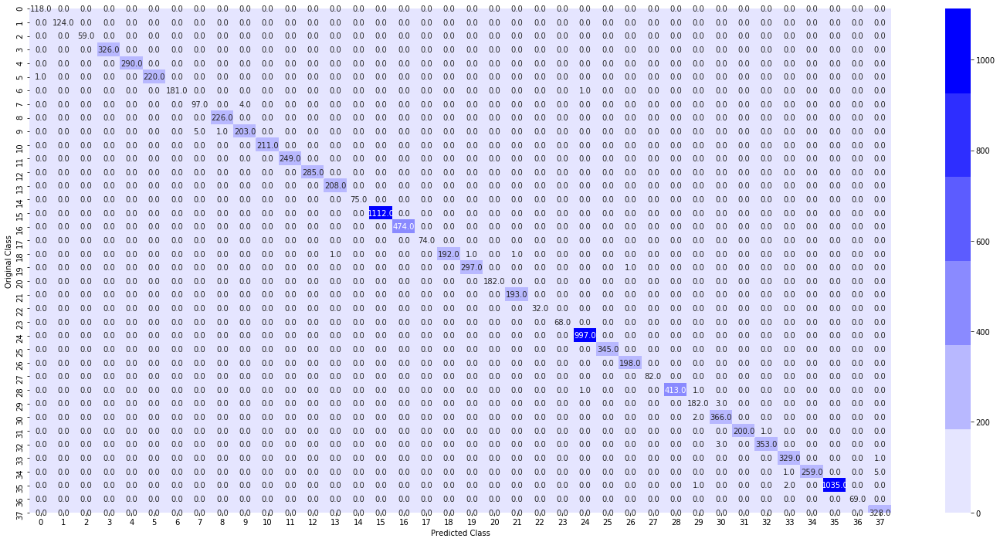

In [0]:
plot_confusion_matrix(y_test,y_pred)

some of images from class 7 gets predicted as class 9 and vice versa.

class 32 is predicted as class 30 in some cases.

class 34 gets predicted as 33,37 in some cases.

In [0]:
def plot_recall_matrix(test_y,predict_y):
    C = confusion_matrix(test_y, predict_y)
    A =(((C.T)/(C.sum(axis=1))).T)
    
    """
    divide each element of the confusion matrix with the sum of elements in that column
    
    C = [[1, 2],
         [3, 4]]
    C.T = [[1, 3],
           [2, 4]]
    C.sum(axis = 1)  axis=0 corresonds to columns and axis=1 corresponds to rows in two diamensional array
    C.sum(axix =1) = [[3, 7]]
    ((C.T)/(C.sum(axis=1))) = [[1/3, 3/7]
                               [2/3, 4/7]]

    ((C.T)/(C.sum(axis=1))).T = [[1/3, 2/3]
                                [3/7, 4/7]]
    sum of row elements = 1"""
    
  
    labels = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37]
    cmap=sns.light_palette("green")
    print("-"*50, "Recall matrix", "-"*50)
    plt.figure(figsize=(25,12))
    sns.heatmap(A, annot=True, cmap=cmap, fmt=".2f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.show()
    print("Sum of rows in recall matrix",A.sum(axis=1))

-------------------------------------------------- Recall matrix --------------------------------------------------


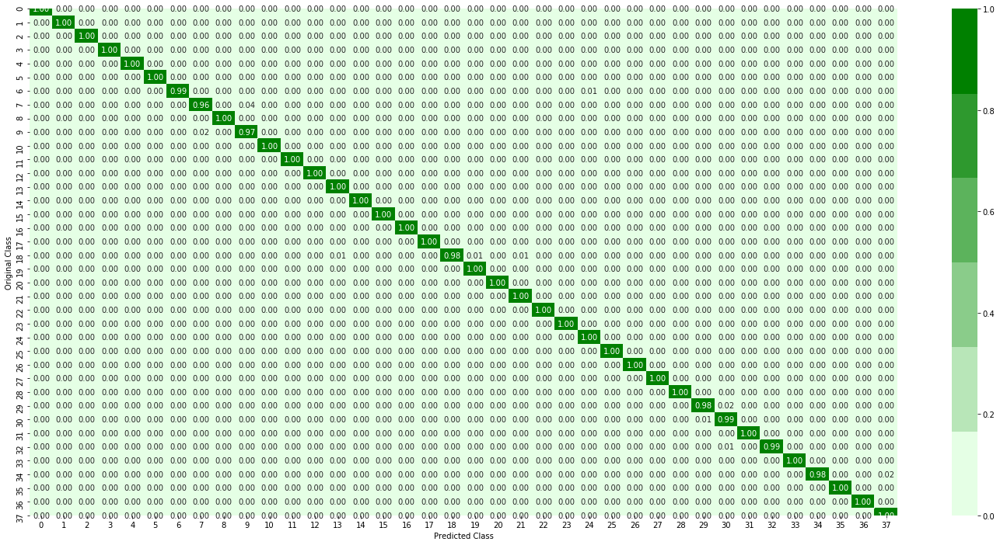

Sum of rows in recall matrix [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [0]:
plot_recall_matrix(y_test,y_pred)

recall for class 7,9 is not good as compared to others

In [0]:
def plot_precision_matrix(test_y,predict_y):
    C = confusion_matrix(test_y, predict_y)
    B =(C/C.sum(axis=0))
  
    '''
    divide each element of the confusion matrix with the sum of elements in that row
    C = [[1, 2],
         [3, 4]]
     C.sum(axis = 0)  axis=0 corresonds to columns and axis=1 corresponds to rows in two diamensional array
     C.sum(axix =0) = [[4, 6]]
     (C/C.sum(axis=0)) = [[1/4, 2/6],
                          [3/4, 4/6]] 
    '''


    labels = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37]
    cmap=sns.light_palette("red")
    print("-"*50, "Precision matrix", "-"*50)
    plt.figure(figsize=(25,12))
    sns.heatmap(B, annot=True, cmap=cmap, fmt=".2f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.show()
    print("Sum of columns in precision matrix",B.sum(axis=0))
    

-------------------------------------------------- Precision matrix --------------------------------------------------


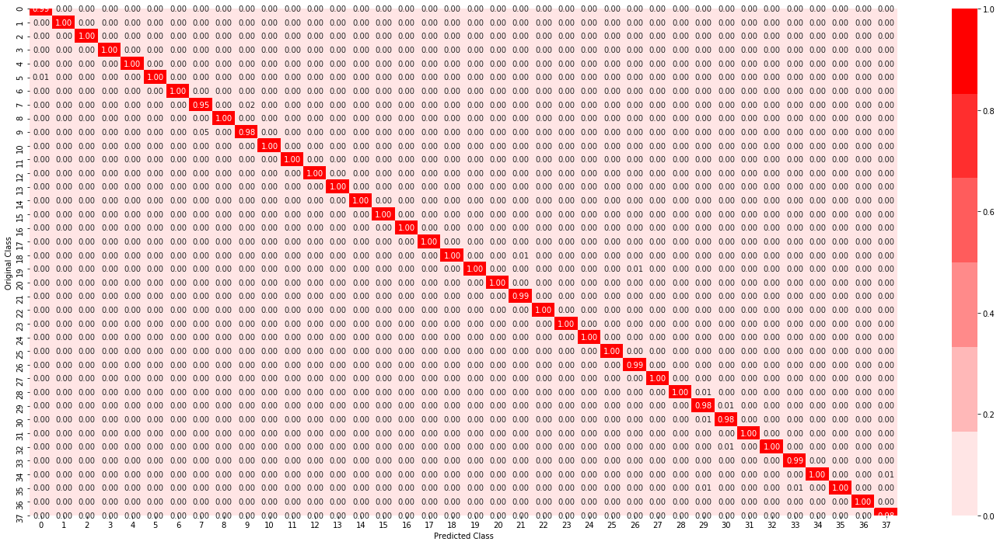

Sum of columns in precision matrix [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [0]:
plot_precision_matrix(y_test,y_pred)

presicion for class 7,9 ,29 & 30 is not good as compared to others.

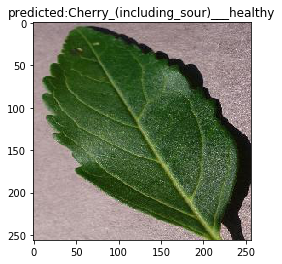

In [0]:
#final function which will take raw input image from used and predict the class 
#predicting for a single image
#correct prediction


'''pred_img function will take the image and then with help of inc_model predict the class and labels will 
help to map the class name and then plot the image with the title showing the predicted class'''


def pred_img(file):
    np_image = Image.open(filename)
    np_image = np.array(np_image).astype('float32')/255
    np_image = transform.resize(np_image, (299, 299, 3))
    image = np.expand_dims(np_image, axis=0)
    pred=inc_model.predict(image)
    k=np.argmax(pred,axis=1)
    clas=labels[k[0]]
    plt.imshow(plt.imread(file))
    plt.title("predicted:"+str(clas))
    plt.show()
  
  
pred_img("cherry_healthy.JPG")  

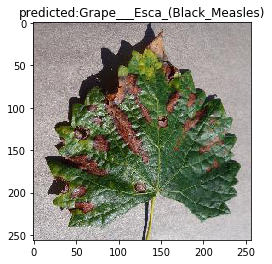

In [0]:
#correctly classified
pred_img("grape_measles.png")

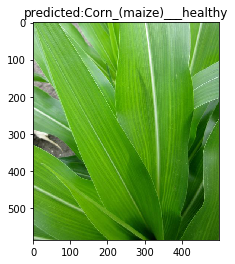

In [0]:
#correctly classified
pred_img("corn_healthy.jpg")

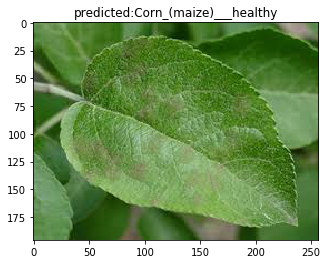

In [0]:
#incorrect prediction
pred_img("apple_scab.jpg")

# FAST AI library

Let's use the fast ai library to do the disease detection from starting.

Reference-https://towardsdatascience.com/fastai-image-classification-32d626da20

In [ ]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

from fastai import *
from fastai.vision import *
from fastai.metrics import error_rate,FBeta
from fastai.callbacks import *

ImageDataBunch.from_folder can be used to load data that has the following structure.

data-dir

  -Train
  
     -Class1
     
     -Class2
     -...
     
   -Valid
   
     -Class1
     
     -Class2
     
     -...

In [0]:
#loading the data
data = ImageDataBunch.from_folder(path=data_dir, train='train', valid='test', ds_tfms=get_transforms(), size=256, bs=64).normalize(imagenet_stats)

In [0]:
#class in data

'''we can use the data object to get more information about data.'''

data.classes

['Apple___Apple_scab',
 'Apple___Black_rot',
 'Apple___Cedar_apple_rust',
 'Apple___healthy',
 'Blueberry___healthy',
 'Cherry_(including_sour)___Powdery_mildew',
 'Cherry_(including_sour)___healthy',
 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot',
 'Corn_(maize)___Common_rust_',
 'Corn_(maize)___Northern_Leaf_Blight',
 'Corn_(maize)___healthy',
 'Grape___Black_rot',
 'Grape___Esca_(Black_Measles)',
 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)',
 'Grape___healthy',
 'Orange___Haunglongbing_(Citrus_greening)',
 'Peach___Bacterial_spot',
 'Peach___healthy',
 'Pepper,_bell___Bacterial_spot',
 'Pepper,_bell___healthy',
 'Potato___Early_blight',
 'Potato___Late_blight',
 'Potato___healthy',
 'Raspberry___healthy',
 'Soybean___healthy',
 'Squash___Powdery_mildew',
 'Strawberry___Leaf_scorch',
 'Strawberry___healthy',
 'Tomato___Bacterial_spot',
 'Tomato___Early_blight',
 'Tomato___Late_blight',
 'Tomato___Leaf_Mold',
 'Tomato___Septoria_leaf_spot',
 'Tomato___Spider_mites Two-spotted_

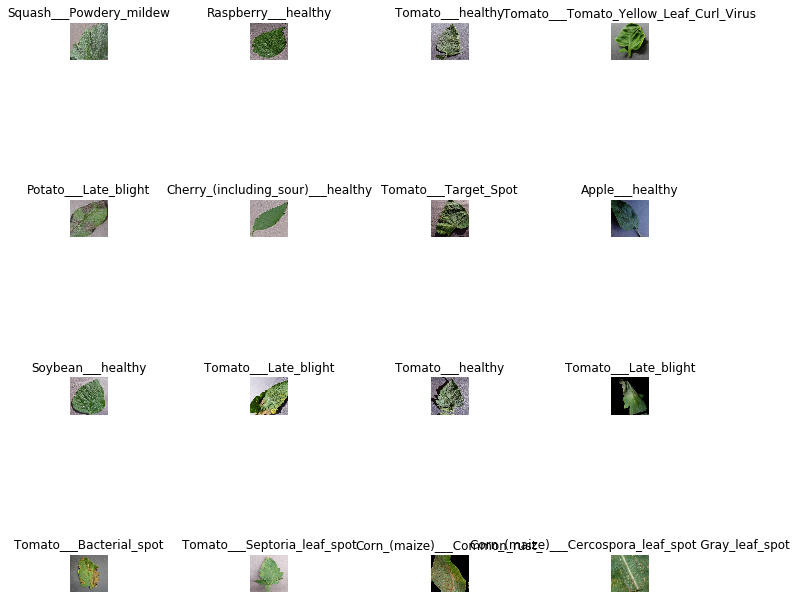

In [0]:
#show a random batch of images using the show_batch method.

data.show_batch(rows=4, figsize=(10,10))

*****************************************************************************************************************
*****************************************************************************************************************
__ResNet architecture__-

One of the problems ResNets solve is the famous vanishing gradient.
Its key idea is to use __Skip Connection__.

With ResNets, the gradients can flow directly through the skip connections backwards from later layers to initial filters.

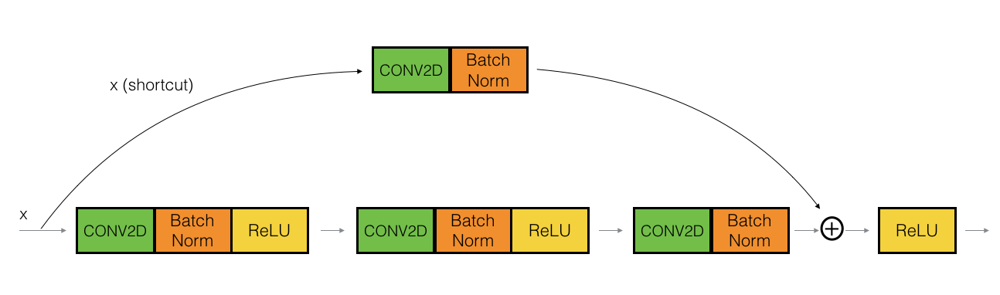

In [0]:
#resnet architecture
from IPython.display import Image
Image('resnet.png',width=500,height=200)

In [0]:
#transfer learning using resnet34

'''there is cnn learner in fastai lib which needs two arguments, the data, and the architecture,
but also supports many other parameters that can be used to customize the model for a given problem '''

learn = cnn_learner(data, models.resnet34, metrics=[Precision(average="weighted"),
                    Recall(average="weighted"),FBeta(average="weighted")], callback_fns=ShowGraph)

Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.cache/torch/checkpoints/resnet34-333f7ec4.pth
100%|██████████| 83.3M/83.3M [00:02<00:00, 43.1MB/s]


epoch,train_loss,valid_loss,precision,recall,f_beta,time
0,0.394207,0.195391,0.940988,0.939751,0.939120,08:58
1,0.216652,0.126474,0.963197,0.961081,0.960252,08:57
2,0.143612,0.087872,0.974770,0.972308,0.972123,08:56
3,0.095625,0.054442,0.983672,0.983254,0.983113,08:54
4,0.078488,0.044941,0.987827,0.986996,0.986921,08:56
5,0.058806,0.031343,0.991168,0.991112,0.991097,08:55
6,0.043090,0.029424,0.991899,0.991393,0.991369,08:55
7,0.035417,0.023828,0.993365,0.993264,0.993255,08:55
8,0.030950,0.022818,0.993615,0.993545,0.993538,08:56
9,0.029865,0.023229,0.993650,0.993545,0.993534,08:57


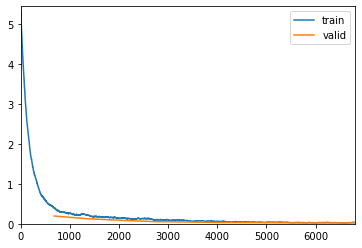

In [0]:
#fit the model

'''To train the layers we can use the fit or fit_one_cycle method. 
The fit method is the “normal” way of training a neural net with a constant learning rate,
whilst the fit_one_cycle method uses something called the 1 cycle policy, 
which basically changes the learning rate over time to achieve better results.'''


learn.fit_one_cycle(10,callbacks=[callbacks.SaveModelCallback(learn, every='epoch', monitor='valid_loss')])

In [0]:
#to interpret the results

'''we can use FastAIs ClassificationInterpretation class to interpret our results. 
To create an interpretation object we need to call the from_learner method and pass it our learner/model.
Then we can use methods like plot_confusion_matrix, plot_top_losses or most_confused.'''

ip= ClassificationInterpretation.from_learner(learn)

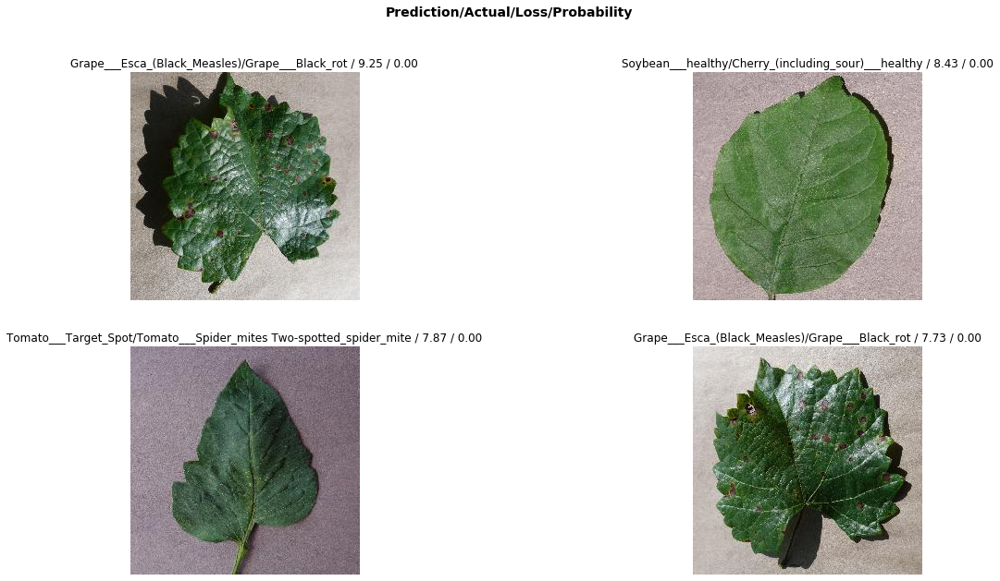

In [0]:
#plot top losses
ip.plot_top_losses(4, figsize=(20,10))


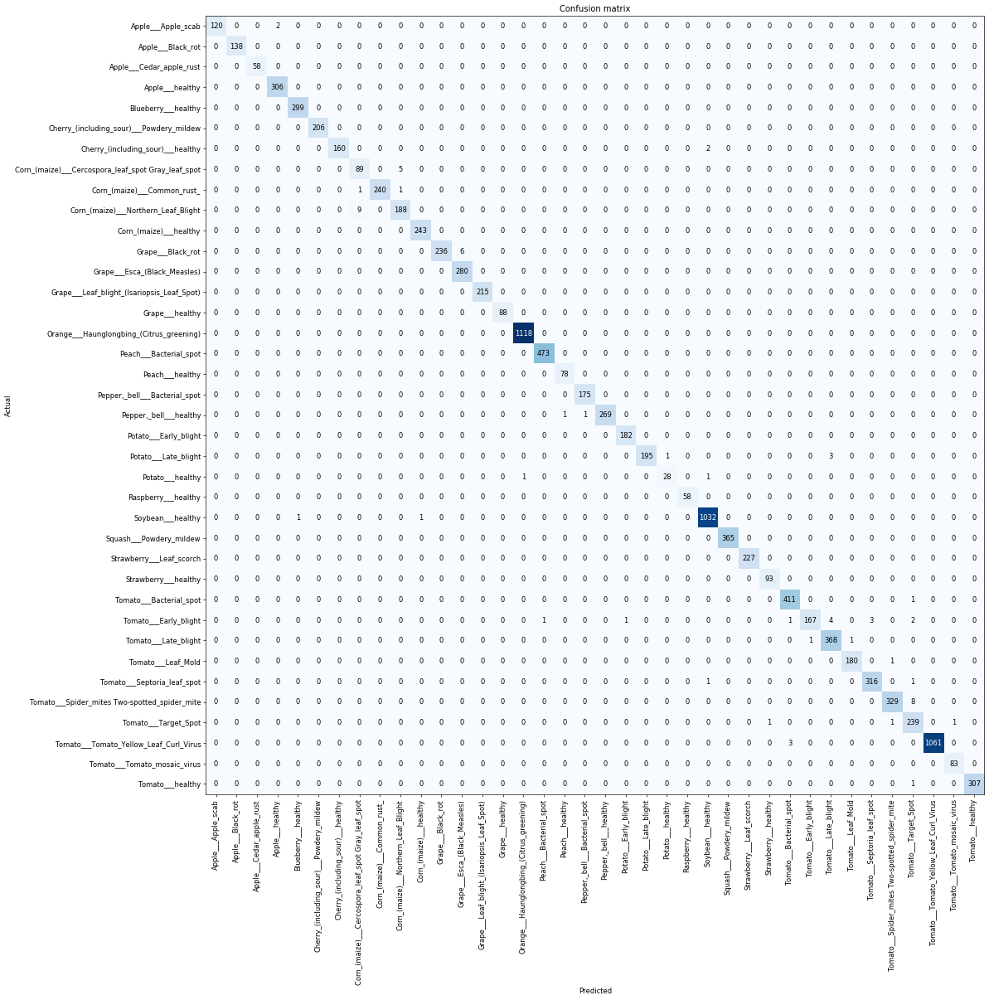

In [0]:
#confusion matrix
ip.plot_confusion_matrix(figsize=(20,20), dpi=60)

In [0]:
#confused prediction(misclassified prediction)
mis=ip.most_confused(min_val=1)
mis

[('Corn_(maize)___Northern_Leaf_Blight',
  'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot',
  9),
 ('Tomato___Spider_mites Two-spotted_spider_mite', 'Tomato___Target_Spot', 8),
 ('Grape___Black_rot', 'Grape___Esca_(Black_Measles)', 6),
 ('Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot',
  'Corn_(maize)___Northern_Leaf_Blight',
  5),
 ('Tomato___Early_blight', 'Tomato___Late_blight', 4),
 ('Potato___Late_blight', 'Tomato___Late_blight', 3),
 ('Tomato___Early_blight', 'Tomato___Septoria_leaf_spot', 3),
 ('Tomato___Tomato_Yellow_Leaf_Curl_Virus', 'Tomato___Bacterial_spot', 3),
 ('Apple___Apple_scab', 'Apple___healthy', 2),
 ('Cherry_(including_sour)___healthy', 'Soybean___healthy', 2),
 ('Tomato___Early_blight', 'Tomato___Target_Spot', 2),
 ('Corn_(maize)___Common_rust_',
  'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot',
  1),
 ('Corn_(maize)___Common_rust_', 'Corn_(maize)___Northern_Leaf_Blight', 1),
 ('Pepper,_bell___healthy', 'Peach___healthy', 1),
 ('Pepper,_bell___heal

********************************************************************************************************
********************************************************************************************************
***these are some classes which are mispredicted as other classes-***

Corn_ Northern_Leaf_Blight gets predicted as Corn __ Cercospora_leaf_spot Gray_leaf_spot and vice versa.

Tomato___Spider_mites Two-spotted_spider_mite gets predicted asTomato___Target_Spot

Grape___Black_rot gets predicted as Grape___Esca_(Black_Measles)
 
Tomato___Early_blight gets predicted as Tomato___Late_blight

Potato___Late_blight gets predicted as Tomato___Late_blight

Tomato___Early_blight gets predicted as Tomato___Septoria_leaf_spot

Tomato___Tomato_Yellow_Leaf_Curl_Virus gets predicted as Tomato___Bacterial_spot

Apple___Apple_scab gets predicted as Apple___healthy

Cherry_(including_sour) _ healthy gets predicted as Soybean __ healthy

Tomato___Early_blight gets predicted asTomato___Target_Spot

In [0]:
#total misclassified image

l=[]
for i in mis:
    l.append(i[2])
print("total misclassified image:",sum(l)) 
  

total misclassified image: 69


In [0]:
#learning rate finder

'''To find the perfect learning rates we can use the lr_find and recorder.plot methods
 which create a plot that relates the learning rate with the loss.
'''

learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


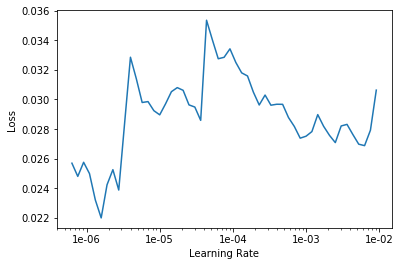

In [0]:
#plot of loss vs lr 
learn.recorder.plot()

In [0]:
#saving the model in the pkl file

learn.export('resnet.pkl')

In [0]:
#final Function which takes raw image from user and gives the output class. 

'''pred_img function takes the image and with help of save model we will use it to predict the class and 
the predicted class will be shown title of the image'''

def pred_img(file):
    img=open_image(file)
    cat,_,_=learn.predict(img)
    return img.show(title="predicted:"+str(cat))
  

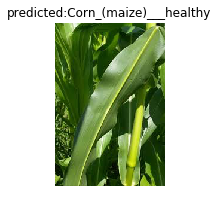

In [0]:
##prediction on image downloaded from google 
#correct prediction
pred_img("corn.jpg")

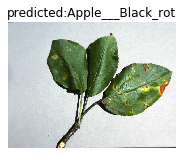

In [0]:
#prediction on image downloaded from google 
#incorrect prediction
pred_img("scab.jpg")

# Result

In [0]:
from prettytable import PrettyTable
x=PrettyTable()

print("RESULTS")
x.field_names=["Value","AlexNet model","Inception model","Resnet34"]
x.add_row(["No. of misclassified image",1983,37,69])
x.add_row(["Loss",0.6361,0.01538,0.02322])
x.add_row(["Precision_weighted",85.2813,99.6561,99.3650])
x.add_row(["Recall_weighted",81.4482,99.6538,99.3545])
x.add_row(["F1_weighted",81.3778,99.6539,99.3545])

print(x)

RESULTS
+----------------------------+---------------+-----------------+----------+
|           Value            | AlexNet model | Inception model | Resnet34 |
+----------------------------+---------------+-----------------+----------+
| No. of misclassified image |      1983     |        37       |    69    |
|            Loss            |     0.6361    |     0.01538     | 0.02322  |
|     Precision_weighted     |    85.2813    |     99.6561     |  99.365  |
|      Recall_weighted       |    81.4482    |     99.6538     | 99.3545  |
|        F1_weighted         |    81.3778    |     99.6539     | 99.3545  |
+----------------------------+---------------+-----------------+----------+


#  Steps-
1-Load the data and explore it to understand which also helps in knowing how to split the data.

2-split the data into train and test.

3-try various models to get which works best.

4-plot the confusion matrix and analyse it.

5-report loss and other metrics of each models.